<a href="https://colab.research.google.com/github/vitroid/yamanashi-water/blob/main/air/nox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
try:
    # On Google Colab
    from google.colab import drive
    drive.mount('/content/drive')

    BASEDIR="drive/MyDrive/DataAnalysis/相模湖・津久井湖土地・水質/yamanashi-water/air/"
except:
    BASEDIR="./"

,date,19202030,19204010,19206010,19441030
0,2009-04-30,8.324022,14.952450,27.263305,11.263966
1,2009-05-31,6.637838,13.287838,23.317568,8.982432
2,2009-06-30,7.313498,15.226744,19.205594,12.721335
3,2009-07-31,7.240541,15.839189,20.811798,13.851351
4,2009-08-31,7.675676,14.851351,16.679296,11.037838
...,...,...,...,...,...
139,2020-11-30,6.746143,9.415966,22.550459,9.270308
140,2020-12-31,9.385346,11.140921,NaN,11.886179
141,2021-01-31,10.146341,13.330623,27.785150,11.585831
142,2021-02-28,6.644042,9.742081,19.666667,9.360360


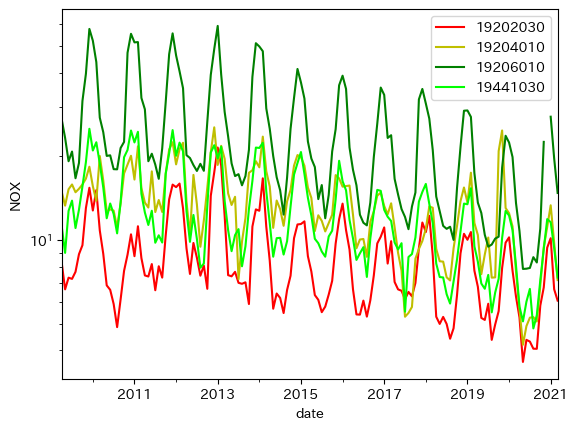

In [3]:
# 指定された局の、全期間のNOX値を抽出する。

import sys
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.set_ylabel("NOX")

stations = {"19202030":"r","19204010":"y","19206010":"g","19441030":"lime"}

mdf = []
for station in stations:
    dfs = []
    for year in range(2009, 2021):
        with open(f"{BASEDIR}19/{year}/j19{year}_{station}.csv") as f:
            df = pd.read_csv(f, parse_dates=[1])  # parse date time in column 1
            dfs.append(df)

    dfs = pd.concat(dfs)

    dfs.index = dfs.date

    # 月単位にグループ化します。
    grouped_df = dfs["NOX"].groupby(pd.Grouper(level="date", freq="M"))

    # 各グループの平均値を計算します。
    mean_df = grouped_df.mean()

    # 結果を表示します。
    # print(mean_df)
    mean_df.plot(color=stations[station], ax=ax,label=station)
    mdf.append(mean_df)


mdf = pd.concat(mdf, axis=1)
mdf.columns=stations
mdf = mdf.reset_index(drop=False)

    # plt.plot(mean_df["NOX"])
plt.yscale("log")
plt.legend()
mdf

* これが改良版の大気から相模湖への輸送モデルの$c(t,x)$に相当する。
   * 農地や森からの排出に周期性があるのかと思っていたが、そうではなくインプットの大気のNOX濃度自体が年周振動している。冬場に最大になるのは暖房のせいか?
* 地目面積$A_i$は`land/`で求めた。
* ブロックごとの排出窒素総量$N_{out}(t,x)$は`flow`で求めた。

これらから、地目ごと、月ごとの沈着速度係数$V_i(t)$を推定する。

例えば、12月に限定すれば、
$$N_{out}(\textrm{Dec},\textrm{red})=c(\textrm{Dec},\textrm{red})\sum_{i\in CoL}A_iV_i(\textrm{Dec})$$
|Symbol|Value|
|--|--|
|Dec|12月|
|red|Y-2,Y-3|

$V_i$は地目ごとの変数で、5つある。しかし、集水域は4種類しかない。そのため、$V_i$の値は確定しないのではないか?

In [4]:
len(mean_df)

144

発想を変え、NOX濃度と流域全窒素排出のあいだの相関を見る。

In [5]:
flows = pd.read_csv(f"{BASEDIR}../flow/4bridges2000.csv") # 2000年4月以降の252ヵ月
flows

,Unnamed: 0,"('昭和橋', '流量')","('昭和橋', '全窒素')","('富士見橋', '流量')","('富士見橋', '全窒素')","('大月橋', '流量')","('大月橋', '全窒素')","('桂川橋', '流量')","('桂川橋', '全窒素')"
0,0,1.0200,1.60,2.9300,1.20,2.0700,1.7,32.3200,1.6
1,1,0.9700,1.30,2.6200,1.20,5.5200,1.6,39.1000,1.5
2,2,0.5700,1.50,2.3800,1.20,2.3100,1.6,48.7000,1.5
3,3,1.3400,1.40,3.8500,1.30,5.3000,1.7,41.0000,1.5
4,4,5.1800,0.29,4.3100,1.10,4.8000,1.4,43.9800,1.3
...,...,...,...,...,...,...,...,...,...
247,247,4.4277,0.57,4.5551,1.00,2.9422,1.0,35.3546,1.1
248,248,4.4304,0.66,4.5471,1.00,2.2754,1.1,32.6497,1.2
249,249,0.9716,1.30,4.8280,0.98,1.8195,1.2,23.0379,1.3
250,250,1.8441,1.00,4.7207,0.97,1.6346,1.3,22.1846,1.2


月平均のNOX濃度を別表からとってくる。これで2000年以降の情報がそろう。

In [6]:
import pandas as pd
import numpy as np


# read_csvが読み損じるので、自分で読む。
def read_csv(filename, sep=",", encoding="utf8"):
    rows = []
    with open(filename, encoding=encoding) as f:
        for line in f.readlines():
            cols = line.split(sep)[:143]
            rows.append(cols)
    df = pd.DataFrame(rows[1:])
    df.columns = rows[0][:143]
    print(rows[0][:143])
    return df


cols = """月平均値(ppm)_４月
同左_５月.2
同左_６月.2
同左_７月.2
同左_８月.2
同左_９月.2
同左_10月.2
同左_11月.2
同左_12月.2
同左_１月.2
同左_２月.2
同左_３月.2
""".splitlines()

# 2008年のデータはコラム名をつけまちがっている!!!信じられん。

stations = [19202030, 19204010, 19206010]

nox = []
for year in range(2000, 2021):
    if year >= 2003:
        cols = "月平均値(ppm)_４月,月平均値(ppm)_５月,月平均値(ppm)_６月,月平均値(ppm)_７月,月平均値(ppm)_８月,月平均値(ppm)_９月,月平均値(ppm)_10月,月平均値(ppm)_11月,月平均値(ppm)_12月,月平均値(ppm)_１月,月平均値(ppm)_２月,月平均値(ppm)_３月".split(
            ","
        )
    filename = f"{BASEDIR}../TD20231218_155555_51/TD{year}0419.txt"
    cols_in_file = list(
        pd.read_csv(
            filename,
            sep=",",
            nrows=1,
            encoding="cp932",
        )
    )
    print(len(cols_in_file))
    df = pd.read_csv(
        filename,
        encoding="cp932",
        sep=",",
        usecols=cols_in_file,
    )
    df = df.loc[:, ~df.columns.duplicated()]
    print(year, df)
    for i, col in enumerate(cols):
        month = i + 4
        y = year
        if month > 12:
            y += 1
            month -= 12
        row = []
        for station in stations:
            rows = df[df["測定局コード"] == station]
            if len(rows) > 0:
                row.append(rows.iloc[0][col])
            else:
                row.append(np.NaN)
        print(row)
        nox.append([float(x) for x in row])

nox = pd.DataFrame(nox, columns=stations)

nox

175
2000     測定年度  項目種類コード  項目コード_数字 項目コード_英数字  測定方法コード  都道府県コード 都道府県名        同左_ローマ字  \
0   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
1   2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   
2   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
3   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
4   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
5   2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   
6   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
7   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
8   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
9   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
10  2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   

    市区町村コード  市区町村名  ... Unname

,19202030,19204010,19206010
0,0.011,0.024,0.030
1,0.009,0.027,0.024
2,0.011,0.029,0.027
3,0.010,0.023,0.023
4,0.011,0.023,0.022
...,...,...,...
247,0.007,0.009,0.023
248,0.009,0.011,NaN
249,0.010,0.013,0.028
250,0.007,0.010,0.020


<Axes: >

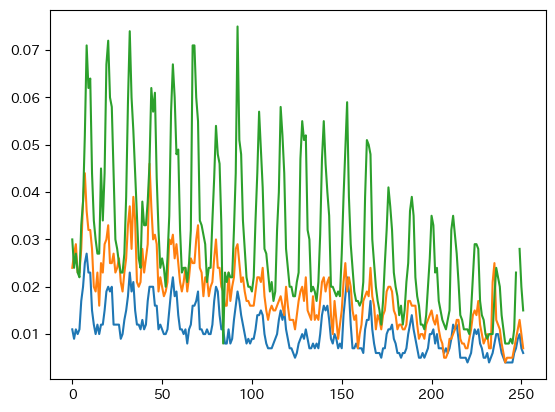

In [7]:
nox[19202030].plot()
nox[19204010].plot()
nox[19206010].plot()


In [8]:
flows = pd.read_csv(f"{BASEDIR}../flow/4bridges2000.csv") # 2000年4月以降の252ヵ月
flows

,Unnamed: 0,"('昭和橋', '流量')","('昭和橋', '全窒素')","('富士見橋', '流量')","('富士見橋', '全窒素')","('大月橋', '流量')","('大月橋', '全窒素')","('桂川橋', '流量')","('桂川橋', '全窒素')"
0,0,1.0200,1.60,2.9300,1.20,2.0700,1.7,32.3200,1.6
1,1,0.9700,1.30,2.6200,1.20,5.5200,1.6,39.1000,1.5
2,2,0.5700,1.50,2.3800,1.20,2.3100,1.6,48.7000,1.5
3,3,1.3400,1.40,3.8500,1.30,5.3000,1.7,41.0000,1.5
4,4,5.1800,0.29,4.3100,1.10,4.8000,1.4,43.9800,1.3
...,...,...,...,...,...,...,...,...,...
247,247,4.4277,0.57,4.5551,1.00,2.9422,1.0,35.3546,1.1
248,248,4.4304,0.66,4.5471,1.00,2.2754,1.1,32.6497,1.2
249,249,0.9716,1.30,4.8280,0.98,1.8195,1.2,23.0379,1.3
250,250,1.8441,1.00,4.7207,0.97,1.6346,1.3,22.1846,1.2


In [9]:
# Google Colab
! pip install japanize_matplotlib


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


[[1.         0.47462818]
 [0.47462818 1.        ]]


/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:11: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"], 1)


Text(0.5, 1.0, '桂川橋')

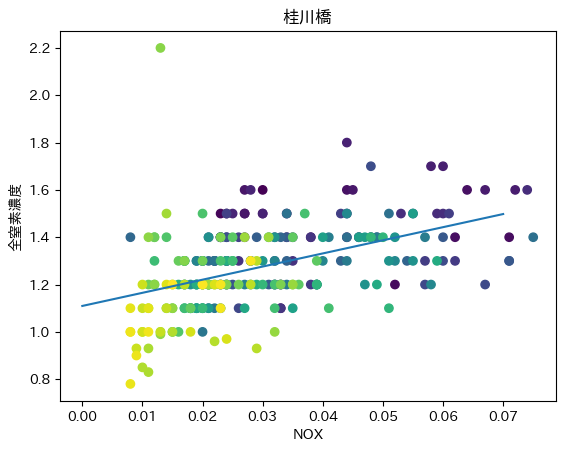

In [10]:
import matplotlib.pyplot as plt
import japanize_matplotlib

plt.scatter(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"]))
a, b = np.polyfit(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"], 1)
X = np.linspace(0,0.07,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("桂川橋")

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"], 1)


[[1.         0.41450748]
 [0.41450748 1.        ]]


Text(0.5, 1.0, '富士見橋')

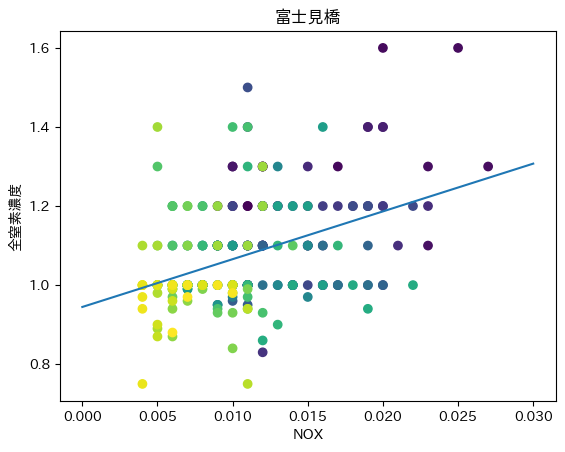

In [11]:
plt.scatter(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"]))
a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"], 1)
X = np.linspace(0,0.03,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("富士見橋")

[[1.         0.62693065]
 [0.62693065 1.        ]]


/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"], 1)


Text(0.5, 1.0, '大月橋')

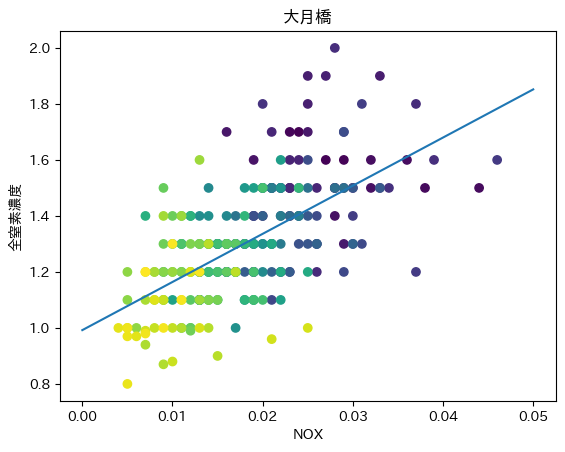

In [12]:
plt.scatter(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"]))
a, b = np.polyfit(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"], 1)
X = np.linspace(0,0.05,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("大月橋")

In [13]:
a,b

(17.19496782347407, 0.9921505074734654)

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[0:12], flows["('昭和橋', '全窒素')"][:12])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[12:24], flows["('昭和橋', '全窒素')"][12:24])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[24:36], flows["('昭和橋', '全窒素')"][24:36])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26

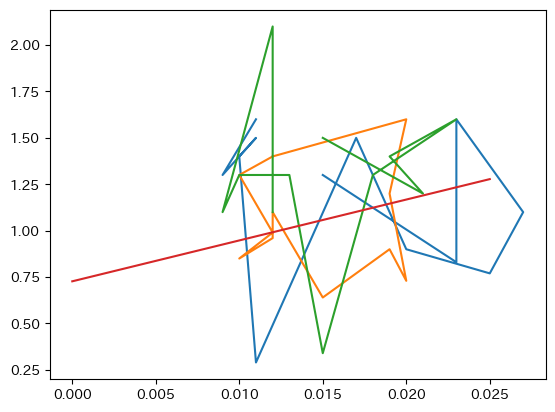

In [14]:

plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[0:12], flows["('昭和橋', '全窒素')"][:12])
plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[12:24], flows["('昭和橋', '全窒素')"][12:24])
plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[24:36], flows["('昭和橋', '全窒素')"][24:36])
# plt.scatter(nox.fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"],
#                 c=flows.index,
#     cmap="viridis",
#     vmin=0,
#     vmax=251,
# )
np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"])
a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"], 1)
X = np.linspace(0,0.025,100)
plt.plot(X, X*a+b, "-")


In [15]:
a,b

(22.021400590335386, 0.72721370871452)

In [16]:
nox.fillna(method="ffill").to_numpy()

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/611333846.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  nox.fillna(method="ffill").to_numpy()


array([[0.011, 0.024, 0.03 ],
       [0.009, 0.027, 0.024],
       [0.011, 0.029, 0.027],
       [0.01 , 0.023, 0.023],
       [0.011, 0.023, 0.022],
       [0.017, 0.028, 0.033],
       [0.02 , 0.038, 0.038],
       [0.025, 0.044, 0.052],
       [0.027, 0.036, 0.071],
       [0.023, 0.032, 0.062],
       [0.023, 0.032, 0.064],
       [0.015, 0.028, 0.044],
       [0.012, 0.02 , 0.034],
       [0.01 , 0.019, 0.03 ],
       [0.012, 0.023, 0.027],
       [0.01 , 0.016, 0.027],
       [0.012, 0.025, 0.045],
       [0.012, 0.023, 0.034],
       [0.015, 0.029, 0.044],
       [0.019, 0.03 , 0.067],
       [0.02 , 0.033, 0.072],
       [0.019, 0.025, 0.06 ],
       [0.02 , 0.025, 0.058],
       [0.012, 0.027, 0.044],
       [0.012, 0.023, 0.03 ],
       [0.012, 0.024, 0.028],
       [0.012, 0.026, 0.025],
       [0.009, 0.021, 0.023],
       [0.01 , 0.019, 0.023],
       [0.013, 0.023, 0.027],
       [0.015, 0.026, 0.039],
       [0.018, 0.033, 0.059],
       [0.023, 0.037, 0.074],
       [0.

2変数線形回帰により、背景と大気質依存成分を分離する。

In [17]:
import numpy as np
import scipy
import japanize_matplotlib
import plotly.graph_objects as go
import plotly.io as pio

def trend(cF, B, C, D, E):
    c, F = cF
    return c * (B + C * F) + D + E * F


bridges = {
    "昭和橋": 19202030,
    "富士見橋": 19202030,
    "大月橋": 19204010,
    "桂川橋": 19206010,
}

for bridge, station in bridges.items():
    flowcol = f"('{bridge}', '流量')"
    noxcol = f"('{bridge}', '全窒素')"

    # NOX in the air
    c = nox[station].ffill()

    # River flow
    F = flows[flowcol]

    # N load
    N = flows[flowcol] * flows[noxcol]

    popt, pcov = scipy.optimize.curve_fit(trend, (c, F), N)
    print(popt)

    X = np.linspace(0, np.max(c), 100)
    Y = np.linspace(0, np.max(F), 100)
    X, Y = np.meshgrid(X, Y)
    Z = trend((X, Y), *popt)

    surface = go.Surface(
        x=X,
        y=Y,
        z=Z,
        colorscale="Viridis",
    )

    rawdata = go.Scatter3d(x=c, y=F, z=N, mode="markers")

    mobile = go.Surface(
        x=X,
        y=Y,
        z=trend((X,Y), popt[0], popt[1],0,0),
        colorscale='blues'
    )

    static = go.Surface(
        x=X,
        y=Y,
        z=trend((X,Y), 0,0,popt[2], popt[3]),
        colorscale="greens",
    )


    fig = go.Figure(data=[surface, rawdata, mobile, static])
    fig.update_layout(
        scene=dict(
            xaxis_title="c",
            yaxis_title="F",
            zaxis_title="N",
        ),
        title=dict(text=bridge),
    )
    fig.show()
    pio.write_html(fig, file=f"{bridge}.html", auto_open=True)


[32.61007645 22.36333896  0.58296552  0.15140205]


[-86.67760723  33.24371112   0.7073633    0.77959926]


[13.57008445 12.59581624  0.21255486  0.94109483]


[14.02650009  5.27931862  5.12063705  0.95065865]


オレンジの点は実測値、一番上の面がフィッティング、緑の面が大気以外(畑と森)からの寄与(流量のみに依存するので平坦)、青が大気からの寄与(流量FとNOX濃度cの両方に依存するので曲がる)



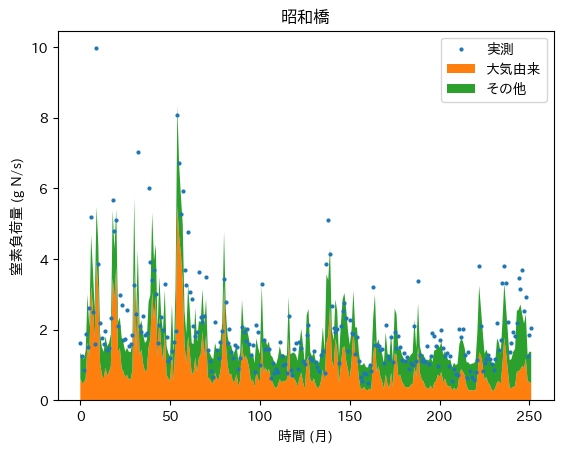

0.6748142929885459 [[1.         0.85208245]
 [0.85208245 1.        ]]


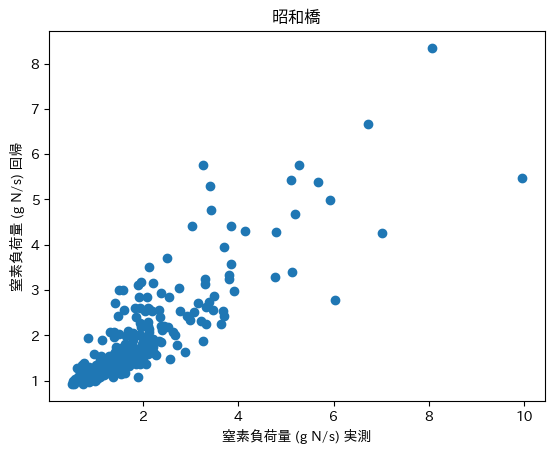

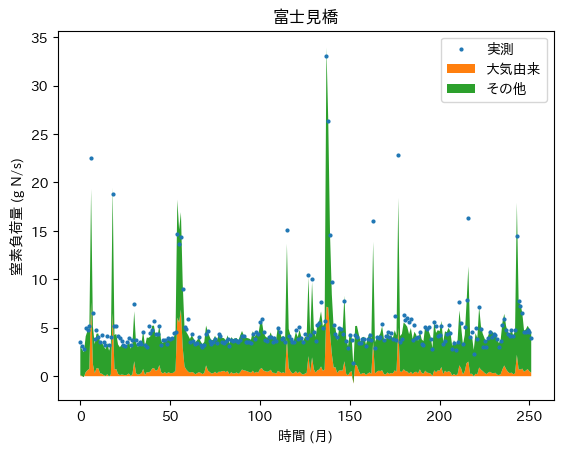

0.763106350045469 [[1.         0.97764456]
 [0.97764456 1.        ]]


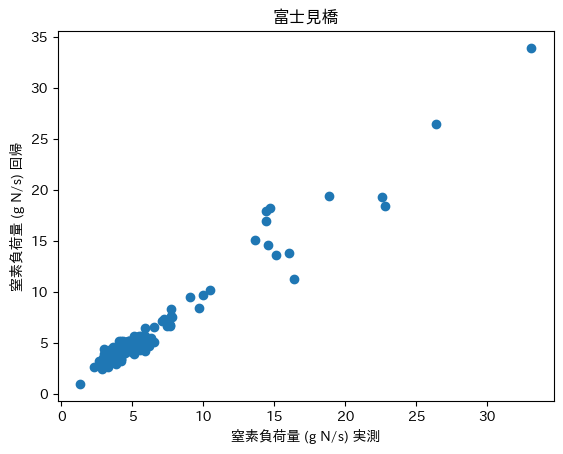

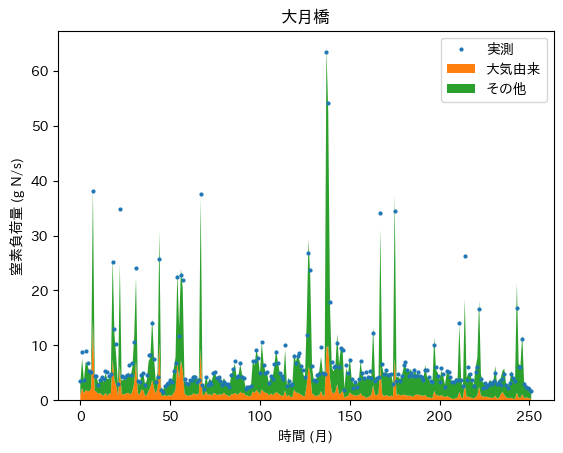

1.150512526140332 [[1.         0.98871338]
 [0.98871338 1.        ]]


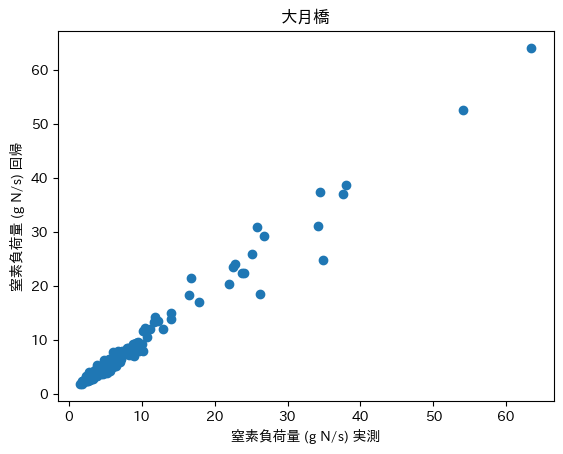

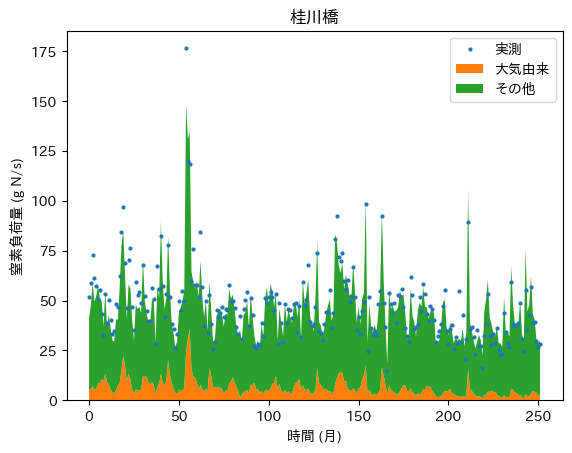

5.983218719187851 [[1.         0.94304294]
 [0.94304294 1.        ]]


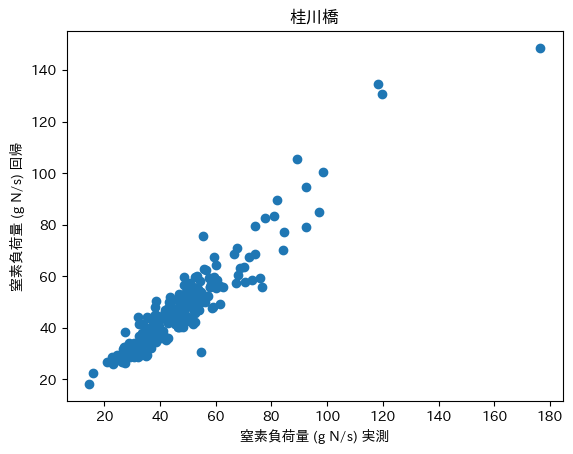

In [24]:
import numpy as np
import scipy
import japanize_matplotlib
import plotly.graph_objects as go
import plotly.io as pio


def trend(cF, B, C, D, E):
    c, F = cF
    return c * (B + C * F) + D + E * F


bridges = {
    "昭和橋": 19202030,
    "富士見橋": 19202030,
    "大月橋": 19204010,
    "桂川橋": 19206010,
}

for bridge, station in bridges.items():
    flowcol = f"('{bridge}', '流量')"  # 単位はm3/s
    noxcol = f"('{bridge}', '全窒素')"  # 単位はppm ~ g/m3

    # NOX in the air
    c = nox[station].ffill()

    # River flow
    F = flows[flowcol]

    # N load
    N = flows[flowcol] * flows[noxcol]

    popt, pcov = scipy.optimize.curve_fit(trend, (c, F), N)
    B, C, D, E = popt

    X = range(len(N))
    Y = N
    plt.plot(X, Y, "o", markersize=2, label="実測")
    plt.stackplot(
        X, c * (B + C * F), D + E * F, baseline="zero", labels=["大気由来", "その他"]
    )
    # plt.yscale("log")
    plt.title(bridge)
    plt.xlabel("時間 (月)")
    plt.ylabel("窒素負荷量 (g N/s)")
    # plt.ylim(0,100)
    plt.legend()
    plt.show()
    print(
        np.mean((N - (c * (B + C * F) + D + E * F)) ** 2) ** 0.5,
        np.corrcoef(N, c * (B + C * F) + D + E * F),
    )
    plt.scatter(N, c * (B + C * F) + D + E * F)
    plt.title(bridge)
    plt.xlabel("窒素負荷量 (g N/s) 実測")
    plt.ylabel("窒素負荷量 (g N/s) 回帰")
    # plt.legend()
    plt.show()